# Import Libraries & Packages

In [1]:
#import packages
import pandas as pd
import numpy as np

import plotly.express as px
import plotly.graph_objects as go

from sklearn.preprocessing import (PolynomialFeatures,OneHotEncoder)

from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# usefull for day of year and month, day
from datetime import datetime as dt

# miscellaneous
import warnings
warnings.filterwarnings("ignore")

# Load Data

In [2]:
df = pd.read_csv('Temperature_last50years_daily.csv')

In [3]:
# Mean of temprature in Fahrenheit 2m above earth surface
# Convert the 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

# delete time zone
df['date'] = df['date'].dt.tz_localize(None)  

# Extract the day of the year, starting from 1
df['day_Of_year'] = df['date'].dt.dayofyear

#creating day of month column
#df['day_Of_month'] = df['date'].dt.day

# creating time step column for all data
df['timestep'] = list(range(df.shape[0]))

# renaming temprature column
df = df.rename({'temperature_2m_mean':'temperature_2m_mean_F'}, axis=1)

# order the columns
df = df [['timestep','date','day_Of_year','temperature_2m_mean_F']]

In [4]:
# Display the updated DataFrame
df.tail(4)

,timestep,date,day_Of_year,temperature_2m_mean_F
18259,18259,2023-12-29,363,47.982803
18260,18260,2023-12-30,364,42.747807
18261,18261,2023-12-31,365,41.889053
18262,18262,2024-01-01,1,41.375300


# plot the temperature of last 50 years

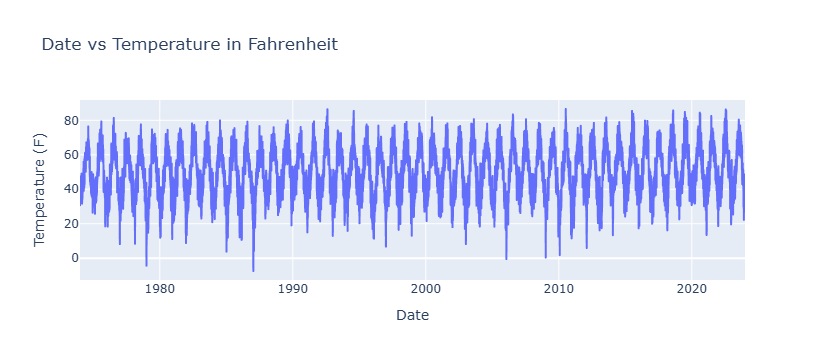

In [5]:
# Create the plot with Plotly Express  for 50 years!
fig = px.line(df,x = 'date', y ='temperature_2m_mean_F',
              title='Date vs Temperature in Fahrenheit')

# Customize the labels
fig.update_layout(xaxis_title='Date', yaxis_title='Temperature (F)')

# Show the plot
fig.show()

# plot of the temperature for 2023 

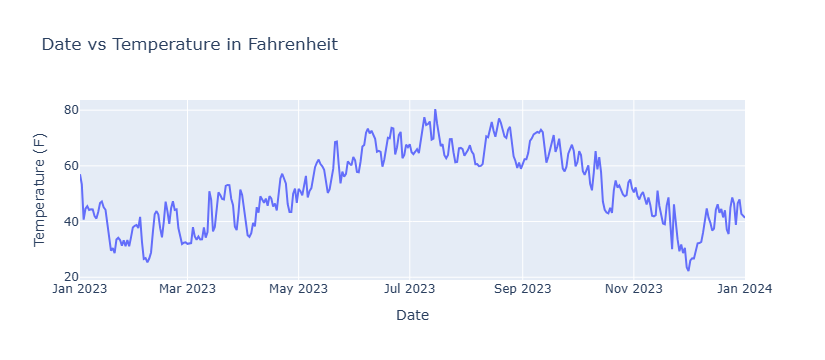

In [6]:
# Create the plot with Plotly Express  for year 2023 !!!!!
fig = px.line(df.iloc[-366:] ,x = 'date', y ='temperature_2m_mean_F',
              title='Date vs Temperature in Fahrenheit')

# Customize the labels
fig.update_layout(xaxis_title='Date', yaxis_title='Temperature (F)')

# Show the plot
fig.show()

# train-test-split

In [7]:
train = df.iloc[:-366]   # 49 years as train
test = df.iloc[-366:]    # 2023 as test

### Feature & Target

In [8]:
# feature and target for trend model

X_trend_train = train[['timestep','day_Of_year']]      
y_trend_train = train['temperature_2m_mean_F']      

In [9]:
# feature and target for trend model

X_trend_test = test[['timestep','day_Of_year']]        
y_trend_test = test['temperature_2m_mean_F']  

## Temperature increasement over 50 years

In [10]:
LR = LinearRegression()
LR.fit(X_trend_train,y_trend_train)
LR.coef_

array([0.0002009 , 0.02701476])

In [11]:
temperature_increase_yearly = 0.00021215 * 365
temperature_increasement_50year = temperature_increase_yearly * 50
print(f'temperature increased yearly: ',temperature_increase_yearly,'Fahrenheit')
print(f'temperature increased over 50 years: ',temperature_increasement_50year,'Fahrenheit') 

temperature increased yearly:  0.07743475 Fahrenheit
temperature increased over 50 years:  3.8717375 Fahrenheit


# Additive

# Trend

## Build trend model 

In [12]:
# trend model

trend_model = make_pipeline(
    PolynomialFeatures(degree = 3),
    LinearRegression()
)

In [13]:
# fit model
trend_model.fit(X_trend_train,y_trend_train)

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures(degree=3)),
                ('linearregression', LinearRegression())])

### predict from model

In [14]:
train['trend_train'] = trend_model.predict(X_trend_train)

In [15]:
test['trend_test'] = trend_model.predict(X_trend_test)

#  Visualizing Trend-Model

### Trend_model_Train

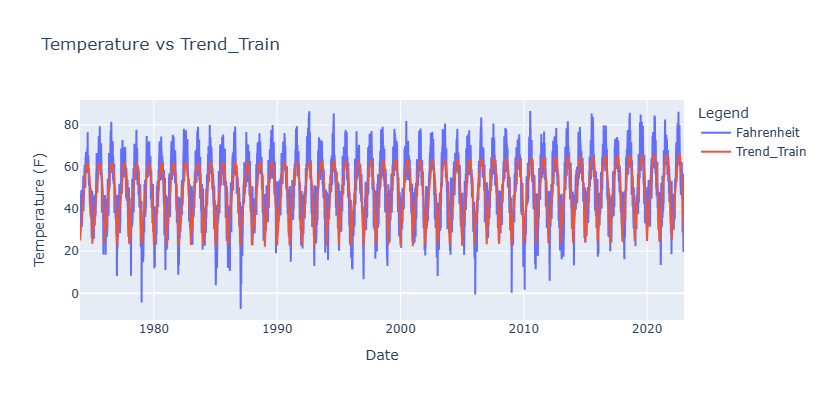

In [16]:
# Create the Plotly figure
fig = go.Figure()

# Add Temperature_2m_mean_K to the plot
fig.add_trace(go.Scatter( x = train["date"], y = train["temperature_2m_mean_F"],
                          mode = 'lines', name='Fahrenheit'))

# Add trend to the plot
fig.add_trace(go.Scatter(x = train["date"], y = train['trend_train'],
                         mode = 'lines', name = 'Trend_Train'))

# Update layout
fig.update_layout(
    title='Temperature vs Trend_Train',
    xaxis_title ='Date',
    yaxis_title ='Temperature (F)',
    legend_title ='Legend',
    width = 950,  
    height = 400,  
)

# Show the plot
fig.show()

### Trend_model_Test

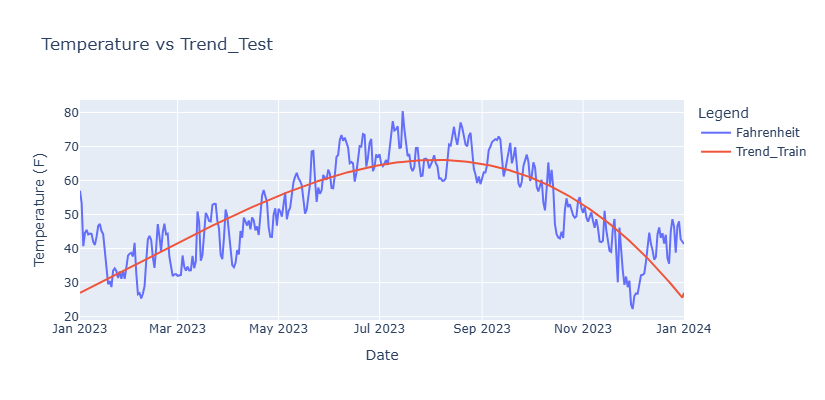

In [17]:
# Create the Plotly figure
fig = go.Figure()

# Add Temperature_2m_mean_F to the plot
fig.add_trace(go.Scatter( x = test["date"], y = test["temperature_2m_mean_F"],
                          mode = 'lines', name='Fahrenheit'))

# Add trend to the plot
fig.add_trace(go.Scatter(x = test["date"], y = test['trend_test'],
                         mode = 'lines', name = 'Trend_Train'))

# Update layout
fig.update_layout(
    title='Temperature vs Trend_Test',
    xaxis_title ='Date',
    yaxis_title ='Temperature (F)',
    legend_title ='Legend',
    width = 950,  
    height = 400,  
)

# Show the plot
fig.show()

# Seasonality-Model

In [18]:
train['detrended_train'] = train["temperature_2m_mean_F"] - train['trend_train']

In [19]:
test['detrended_test'] = test["temperature_2m_mean_F"] - test['trend_test']

#### feature and target for Seasonability

In [20]:
# feature and target for seasonality model

X_seasonality_train = train[['timestep','day_Of_year']]  #train[['timestep']]                               
y_seasonality_train = train['detrended_train']           #train['Temperature_2m_mean_K'] 

In [21]:
# feature and target for seasonality model

X_seasonality_test = test[['timestep','day_Of_year']]   #train[['timestep']]                               
y_seasonality_test = test['detrended_test']              #train['Temperature_2m_mean_K'] 

### Build seasonality model

In [22]:
from sklearn.ensemble import RandomForestRegressor 

seasonal_model = make_pipeline(
    OneHotEncoder( handle_unknown='ignore', drop='first'),
    RandomForestRegressor()
)

# Fit the model

In [23]:
seasonal_model.fit(X_seasonality_train, y_seasonality_train) # fitting the model takes time!

Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(drop='first', handle_unknown='ignore')),
                ('randomforestregressor', RandomForestRegressor())])

# Save the Model and Load it 

In [31]:
# Arjun 
# there is no need for this next time bcs we save the seasonal model
import pickle
#with open('seasonal_model.pkl', 'wb') as file:
#    pickle.dump(seasonal_model, file)

In [ ]:
# just run from here next time
with open('seasonal_model.pkl', 'rb') as file:
    seasonal_model = pickle.load(file)

## Predict from model

In [24]:
#predict train
train['seasonality_train'] = seasonal_model.predict(X_seasonality_train)

In [25]:
#predict test
test['seasonality_test'] = seasonal_model.predict(X_seasonality_test)

# Make trend_seasonal_train/test column for prediction

In [26]:
# combine trend and seasonality
train['trend_seasonal_train'] = train['trend_train'] + train['seasonality_train']
test['trend_seasonal_test'] = test['trend_test'] + test['seasonality_test']

# plot Trend+seasonal train against real temprature

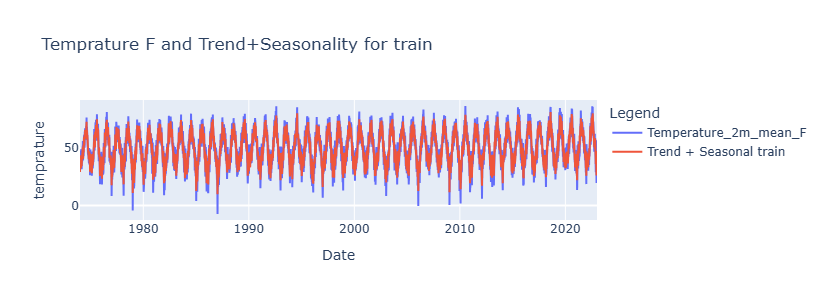

In [27]:
# Create the Plotly figure
fig = go.Figure()

# Add 'log_transformed' line to the plot
fig.add_trace(go.Scatter(x = train['date'] , y = train['temperature_2m_mean_F'],
                         mode='lines', name='Temperature_2m_mean_F'))

# Add 'trend_seasonal' line to the plot
fig.add_trace(go.Scatter(x = train['date'] , y = train['trend_seasonal_train'],
                         mode='lines', name='Trend + Seasonal train'))

# Update layout (adjust the figure size, titles, and legends)
fig.update_layout(
    title='Temprature F and Trend+Seasonality for train',
    xaxis_title='Date',
    yaxis_title='temprature',
    legend_title='Legend',
    width=950,  
    height=300,  
)

fig.show()

# plot trend+seasonality for test against real temprature

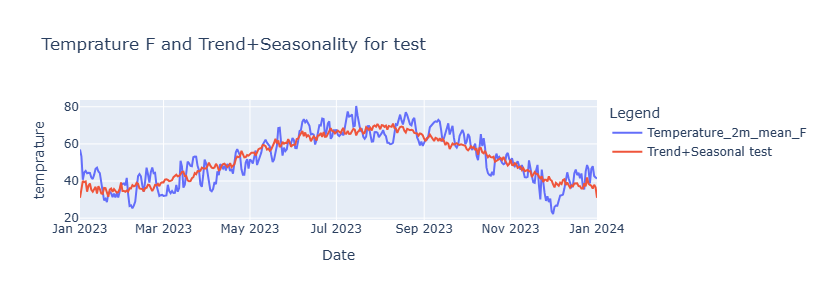

In [28]:
# Create the Plotly figure
fig = go.Figure()

# Add 'log_transformed' line to the plot
fig.add_trace(go.Scatter(x = test['date'] , y = test['temperature_2m_mean_F'],
                         mode='lines', name='Temperature_2m_mean_F'))

# Add 'trend_seasonal' line to the plot
fig.add_trace(go.Scatter(x = test['date'] , y = test['trend_seasonal_test'],
                         mode='lines', name='Trend+Seasonal test'))

# Update layout (adjust the figure size, titles, and legends)
fig.update_layout(
    title='Temprature F and Trend+Seasonality for test',
    xaxis_title='Date',
    yaxis_title='temprature',
    legend_title='Legend',
    width=950,  
    height=300,  
)

fig.show()

# Metrics for Model

In [29]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

# Assuming y_true are the true values, and y_pred are the predicted values
mae = mean_absolute_error(test['temperature_2m_mean_F'], test['trend_seasonal_test']).round(4)
mse = mean_squared_error(test['temperature_2m_mean_F'], test['trend_seasonal_test']).round(4)
rmse = np.sqrt(mse).round(4)
r2 = round(r2_score(test['temperature_2m_mean_F'], test['trend_seasonal_test']),4)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r2}")

Mean Absolute Error (MAE): 5.2236
Mean Squared Error (MSE): 40.5853
Root Mean Squared Error (RMSE): 6.3707
R-squared (R²): 0.7785


In [ ]:
# An R² of 0.7793 for a time series model is a solid indicator of a good fit
#errors of around 5–6°F are not uncommon, 

### Remainder

In [ ]:
train

In [ ]:
# leftover time series devoid of trend and seasonality

train['remainder'] = train['Temperature_2m_mean_K'] - train['trend_seasonal']

In [ ]:
train

In [ ]:
mpl.rc('figure',figsize=(12,3),dpi=100)
train[["remainder"]].plot(legend=True)
sns.despine()

In [ ]:
train[["remainder"]].to_csv("remainder_column.csv", index=False)

In [ ]:
qcd_variance(train['remainder'])

In [ ]:
# statistics stack
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.stats.diagnostic import het_white
from statsmodels.formula.api import ols
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
!pip install pmdarima
import pmdarima as pm
from statsmodels.tsa.ar_model import AutoReg, ar_select_order

In [ ]:
selected_order = ar_select_order(train['remainder'], maxlag = 12)
print(selected_order.ar_lags)

In [ ]:
import pmdarima as pm
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you already have the 'train' DataFrame and ARIMA model trained
# Fit ARIMA model (as in your original code)
ar_model = pm.auto_arima(
    train["remainder"], 
    start_p=0,
    max_p=2,
    seasonality=False,
    stationary=True,
    trace=True,
    n_jobs=-1
)



# Assuming the model is already trained on the 'remainder' column
n_periods = 10  # You can change this to the desired number of forecast periods

# Generate the forecast for 'n_periods' into the future
train["predicted_remainder"] = ar_model.predict_in_sample()


In [ ]:
ar_model.summary()

In [ ]:
train

In [ ]:
train['complete'] = train['trend_seasonal'] + train['predicted_remainder']

mpl.rc('figure',figsize=(12,3),dpi=100)
train[["Temperature_2m_mean_K","complete"]].plot(legend=True)
sns.despine()

In [ ]:
from sklearn.metrics import r2_score

# Assuming you have a DataFrame called 'train' with the columns 'complete' and 'Temperature_2m_mean_K'
actual_values = train["Temperature_2m_mean_K"]
predicted_values = train["complete"]

# Calculate R-squared
r_squared = r2_score(actual_values, predicted_values)

print(f"R-squared: {r_squared}")

In [ ]:
test


In [ ]:
X_test_trend.head(2)

In [ ]:
X_test_trend=test[["day"]]
X_test_seasonal=test[["day_month"]]

y_test=test["Temperature_2m_mean_K"]
X_test.shape

In [ ]:
test["y_predict"]=seasonal_model.predict(X_test_seasonal)+trend_model.predict(X_test_trend)

In [ ]:
test["season_predict"]=seasonal_model.predict(X_test_seasonal)

In [ ]:
train

In [ ]:
test

In [ ]:
test.drop('season_predict',inplace=True,axis=1)

In [ ]:
#test['complete'] = train['trend_seasonal'] + train['predicted_remainder']

mpl.rc('figure',figsize=(12,3),dpi=100)
test[["Temperature_2m_mean_K","test_prediction"]].plot(legend=True)
sns.despine()

In [ ]:
test['reminder_predict_auto_arima'] = ar_model.predict(36) 

In [ ]:
test['test_prediction'] = test['reminder_predict_auto_arima'] + test['y_predict']

In [ ]:
test